# ML_BMS_2023 Final Project Analysis

In [4]:
import numpy as np
import mne
import matplotlib.pyplot as plt
import pandas as pd
import pickle


### Data Wrangling

In [29]:
subj_ids = ['MS003', 'MS016','MS017','MS019','MS020']
base_dir = '/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/'
anat_path = base_dir + '/data/anat/'
ephys_path = '/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/data/ephys/'

In [17]:
epochs_all_subjs_all_evs = pd.read_pickle(rf'{ephys_path}/epochs_epochs.pkl')
baseline_power_epochs = pd.read_pickle(rf'{ephys_path}/baseline_epochs.pkl')
power_epochs = pd.read_pickle(rf'{ephys_path}/power_epochs.pkl')

svm_epochs = power_epochs

In [31]:
#preprocessed data visualization
svm_epochs

{'MS003': {'TrialOnset': nan,
  'DecisionOnset': <EpochsTFR | time : [0.000000, 3.000000], freq : [4.000000, 120.000000], epochs : 150, channels : 81, ~1.36 GB>},
 'MS016': {'TrialOnset': nan,
  'DecisionOnset': <EpochsTFR | time : [0.000000, 3.000000], freq : [4.000000, 120.000000], epochs : 150, channels : 106, ~1.78 GB>},
 'MS017': {'TrialOnset': nan,
  'DecisionOnset': <EpochsTFR | time : [0.000000, 3.000000], freq : [4.000000, 120.000000], epochs : 150, channels : 68, ~1.14 GB>},
 'MS019': {'TrialOnset': nan,
  'DecisionOnset': <EpochsTFR | time : [0.000000, 3.000000], freq : [4.000000, 120.000000], epochs : 150, channels : 81, ~1.36 GB>},
 'MS020': {'TrialOnset': nan,
  'DecisionOnset': <EpochsTFR | time : [0.000000, 3.000000], freq : [4.000000, 120.000000], epochs : 150, channels : 86, ~1.44 GB>}}

In [11]:
#data is n_epochs, n_elecs, n_freq, time

all_subj_epochs = []

event = 'DecisionOnset'
cond = 'regret'
freq_bands = np.logspace(*np.log10([4, 120]), num=20)


for ix, subj_id in enumerate(subj_ids):
    data = svm_epochs[subj_id]['DecisionOnset'].to_data_frame()
    subj_num = ix 
    ch_names = svm_epochs[subj_id]['DecisionOnset'].ch_names
    elec_names = [x.split('-')[0] for x in ch_names]
    for ch in ch_names:
        elec_name = ch.split('-')[0]
        for f in freq_bands:
            #freq_band = data.freqs[freq] #value of frequency
            for epoch in range(150):
                #idx = (subj_num+1)*epoch*(freq+1)
                y = svm_epochs[subj_id]['DecisionOnset'].metadata.regret[epoch]
                y_lab = (-1) if y == 0 else (1)
                all_subj_epochs.append({
                    'subj':subj_num,
                    'epoch':epoch,
                    'freq':f,
                    'elec':elec_name,
                    'av_pow': np.nanmean(data[ch][(data['freq'] == f) & (data['epoch']==epoch)],axis=0),
                    'regret':y_lab
                })
                


/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2065/1130186887.py:31: RuntimeWarning: Mean of empty slice
  'av_pow': np.nanmean(data[ch][(data['freq'] == f) & (data['epoch']==epoch)],axis=0),
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2065/1130186887.py:31: RuntimeWarning: Mean of empty slice
  'av_pow': np.nanmean(data[ch][(data['freq'] == f) & (data['epoch']==epoch)],axis=0),
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2065/1130186887.py:31: RuntimeWarning: Mean of empty slice
  'av_pow': np.nanmean(data[ch][(data['freq'] == f) & (data['epoch']==epoch)],axis=0),
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2065/1130186887.py:31: RuntimeWarning: Mean of empty slice
  'av_pow': np.nanmean(data[ch][(data['freq'] == f) & (data['epoch']==epoch)],axis=0),
/var/folders/xk/q5rxx0ld0hnc9gjlq1dhwqhw0000gn/T/ipykernel_2065/1130186887.py:31: RuntimeWarning: Mean of empty slice
  'av_pow': np.nanmean(data[ch][(data['freq'] == f) & (data['e

In [16]:
svm_epochs_df = pd.DataFrame(all_subj_epochs)
svm_epochs_df.to_csv('/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/data/ephys/all_subj_epochs.csv') #nans included

In [8]:
svm_epochs_df = pd.read_csv('/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/data/ephys/all_subj_epochs.csv',index_col=0)

In [5]:
#getting anatomical information for electrodes 

subj_ids = ['MS003', 'MS016','MS017','MS019','MS020']
base_dir = '/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/'
anat_path = base_dir + '/data/anat/'
rois = ['motor','frontal gyrus','frontal orbital','frontal pole','temporal','cingulate','insular','amygdala','hippocampus']

for region in rois: 
    picks = []
    for ix,subj_id in enumerate(subj_ids):
        elec_file = anat_path + subj_id + '_labels.csv'
        elec_data = pd.read_csv(elec_file)
        elec_data = elec_data.rename(columns={'NMMlabel':'label'})
        picks.append(elec_data[elec_data.YBA_1.str.lower().str.contains(region,na=False)].label.tolist())
        picks.append(elec_data[elec_data['Manual Examination'].str.lower().str.contains(region,na=False)].label.tolist())
    picks = list(np.unique(np.concatenate(picks)))
    picks = [x.lower() for x in picks]
    svm_epochs_df.elec.replace(picks,region,inplace=True)


In [8]:
#adding numeric anatomical coding of electrodes to df

#anat_key = {'motor':0,'frontal gyrus':1,'frontal orbital':2,'frontal pole':3,'temporal':4,'cingulate':5,'insular':6,'amygdala':7,'hippocampus':8,'not_roi':9}

for i in range(9):
    svm_epochs_df.elec.replace(rois[i],i,inplace=True)

#replacing not roi
not_roi = list(np.unique(svm_epochs_df.elec[~svm_epochs_df.elec.isin(rois)]))
svm_epochs_df.elec.replace(not_roi,9,inplace=True)

In [19]:
svm_epochs_df.to_csv('/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/data/ephys/svm_input_V1.csv')

# SVM Classification

## All Subjects SVM Modeling

In [13]:
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.model_selection import train_test_split, cross_val_score, ShuffleSplit, cross_val_predict

In [82]:
df = pd.read_csv('/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/data/ephys/svm_input_V1.csv',index_col=0)

In [83]:
freq_features = np.unique(df.freq)
col_list = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19']

In [84]:
freq_features

array([  4.        ,   4.78413268,   5.72198137,   6.84367951,
         8.18526769,   9.78985165,  11.7089873 ,  14.00433719,
        16.74965179,  20.03313911,  23.96029885,  28.65731217,
        34.27509589,  40.99415156,  49.03036501,  58.64194284,
        70.13770874,  83.88702606, 100.33166563, 120.        ])

In [10]:
#adding numeric frequency coding to df and making svm inputs

freq_features = np.unique(df.freq)
col_list = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19']
svm_X = pd.DataFrame(columns = col_list)

for i in range(20):
    f_idx = np.where(df['freq']==freq_features[i])[0]
    svm_X[col_list[i]] = list(df['av_pow'][f_idx])


svm_Y = list(df['regret'][f_idx])
svm_X = svm_X.fillna(0)

In [11]:
X_data = svm_X
Y_data = svm_Y

class_balance = sum(np.array(Y_data) == 1)/63300
class_balance = max(class_balance, 1. - class_balance)
print('The class balance of the dataset is ', class_balance)

The class balance of the dataset is  0.5276461295418642


In [14]:
X_train, X_test, Y_train, Y_test = train_test_split(X_data,Y_data,test_size=0.3)

svc_V1 = SVC(C=1, kernel='linear')

In [18]:
# Define an SVM classifier (SVC) with a linear kernel
svc_V1.fit(X_train, Y_train)

SVC(C=1, kernel='linear')

              precision    recall  f1-score       support
-1             0.528699  1.000000  0.691698  10040.000000
1              0.000000  0.000000  0.000000   8950.000000
accuracy       0.528699  0.528699  0.528699      0.528699
macro avg      0.264350  0.500000  0.345849  18990.000000
weighted avg   0.279523  0.528699  0.365700  18990.000000
Accuracy Score: 0.5286993154291733
ROC AUC Score 0.5


/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

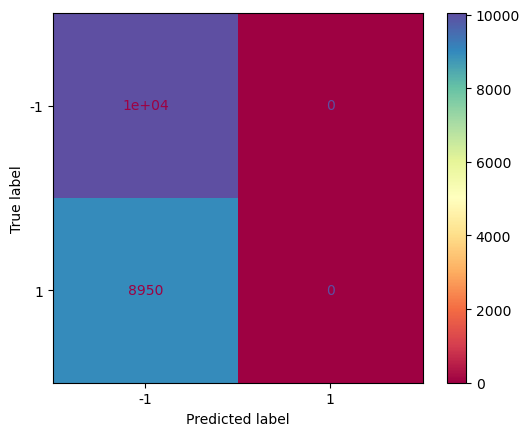

In [21]:
#test accuracy on train data
y_pred = svc_V1.predict(X_test)

confusion = metrics.confusion_matrix(Y_test,y_pred)
metrics.ConfusionMatrixDisplay.from_predictions(Y_test,y_pred,cmap='Spectral')

#classification_score
print(pd.DataFrame(metrics.classification_report(Y_test,y_pred, labels=np.unique(Y_test),output_dict=True)).T)

#accuracy_score
print('Accuracy Score:', metrics.accuracy_score(Y_test,y_pred))

#roc_auc_score
print('ROC AUC Score',metrics.roc_auc_score(Y_test,y_pred))

In [ ]:
#cross validation of data subsetting

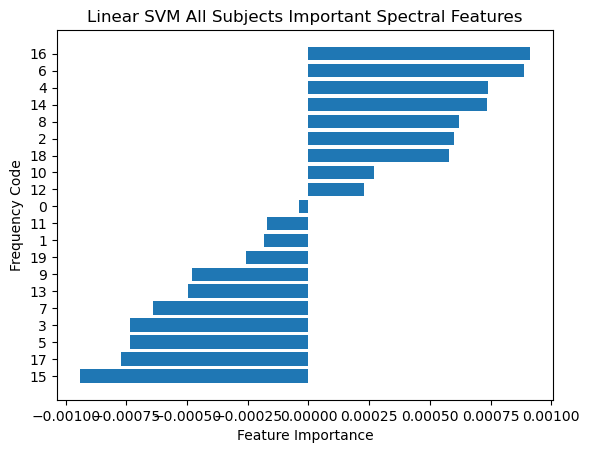

In [22]:
from matplotlib import pyplot as plt

def f_importances(coef, names):
    imp = coef
    imp,names = zip(*sorted(zip(imp,names)))
    plt.barh(range(len(names)), imp, align='center')
    plt.yticks(range(len(names)), names)
    plt.ylabel('Frequency Code')
    plt.xlabel('Feature Importance')
    plt.title('Linear SVM All Subjects Important Spectral Features')
    plt.show()

features_names = col_list
f_importances(svc_V1.coef_[0], features_names)

In [23]:
from sklearn.model_selection import cross_val_score, ShuffleSplit
svc_V2 = SVC(C=1, kernel='linear')
cv = ShuffleSplit(n_splits=10,train_size = 0.8, test_size=0.2, random_state=42)
scores_full = cross_val_score(svc_V2, X_data, Y_data, cv=cv, n_jobs=1)
print ("Classification score: %s (std. %s)" % (np.mean(scores_full), np.std(scores_full)))


Classification score: 0.5265086887835704 (std. 0.0022740585662599034)


# Single Subject Modeling

### Restructuring Data Frames for Single Subject Analyses

In [15]:
svm_epochs_df = pd.read_csv('/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/data/ephys/all_subj_epochs.csv',index_col=0)
subj_ids = ['MS003', 'MS016','MS017','MS019','MS020']
subj_id_codes = [0,1,2,3,4]

#split power_epochs into subject specific dfs 
df = svm_epochs_df

ms003 = df[df['subj']==0]
ms016 = df[df['subj']==1]
ms017 = df[df['subj']==2]
ms019 = df[df['subj']==3]
ms020 = df[df['subj']==4]


In [18]:
#class variable split by subject

regret_by_subj = pd.DataFrame(columns=subj_ids)
for subj_id in subj_ids:
    regret_by_subj[subj_id] = svm_epochs[subj_id]['DecisionOnset'].metadata.regret

In [19]:
# MS003 expanding df for more features (n_freq x n_elec)
ms003_all_features = {}
features_keys = []

subj_id = 'MS003'
freq_features = np.unique(ms003.freq)
roi_features = np.unique(ms003.elec)

for f in freq_features:
    for r in roi_features:
        key = ':'.join(list([str(f),str(r)]))
        features_keys.append(key)
        ms003_all_features[key] = list(ms003.av_pow[(ms003.freq == f) & (ms003.elec == r)])


In [20]:
ms003_inputs_V1 =pd.DataFrame.from_dict(ms003_all_features)
ms003_key_inputs_V1 = features_keys

In [21]:
# MS016 expanding df for more features (n_freq x n_elec)
ms016_all_features = {}
features_keys = []

subj_id = 'MS016'
freq_features = np.unique(ms016.freq)
roi_features = np.unique(ms016.elec)

for f in freq_features:
    for r in roi_features:
        key = ':'.join(list([str(f),str(r)]))
        features_keys.append(key)
        ms016_all_features[key] = list(ms016.av_pow[(ms016.freq == f) & (ms016.elec == r)])

In [22]:
ms016_inputs_V1 =pd.DataFrame.from_dict(ms016_all_features)
ms016_key_inputs_V1 = features_keys

In [23]:
# MS017 expanding df for more features (n_freq x n_elec)
ms017_all_features = {}
features_keys = []

subj_id = 'MS017'
freq_features = np.unique(ms017.freq)
roi_features = np.unique(ms017.elec)

for f in freq_features:
    for r in roi_features:
        key = ':'.join(list([str(f),str(r)]))
        features_keys.append(key)
        ms017_all_features[key] = list(ms017.av_pow[(ms017.freq == f) & (ms017.elec == r)])

In [24]:
ms017_inputs_V1 =pd.DataFrame.from_dict(ms017_all_features)
ms017_key_inputs_V1 = features_keys

In [25]:
# MS019 expanding df for more features (n_freq x n_elec)
ms019_all_features = {}
features_keys = []

subj_id = 'MS019'
freq_features = np.unique(ms019.freq)
roi_features = np.unique(ms019.elec)

for f in freq_features:
    for r in roi_features:
        key = ':'.join(list([str(f),str(r)]))
        features_keys.append(key)
        ms019_all_features[key] = list(ms019.av_pow[(ms019.freq == f) & (ms019.elec == r)])

In [26]:
ms019_inputs_V1 =pd.DataFrame.from_dict(ms019_all_features)
ms019_key_inputs_V1 = features_keys

In [27]:
# MS020 expanding df for more features (n_freq x n_elec)
ms020_all_features = {}
features_keys = []

subj_id = 'MS020'
freq_features = np.unique(ms020.freq)
roi_features = np.unique(ms020.elec)

for f in freq_features:
    for r in roi_features:
        key = ':'.join(list([str(f),str(r)]))
        features_keys.append(key)
        ms020_all_features[key] = list(ms020.av_pow[(ms020.freq == f) & (ms020.elec == r)])

In [28]:
ms020_inputs_V1 =pd.DataFrame.from_dict(ms020_all_features)
ms020_key_inputs_V1 = features_keys

In [29]:
#save input dataframes 
ephys_path = '/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/data/ephys/'

ms003_inputs_V1.to_csv(ephys_path+'ms003_inputs_V1.csv')
ms016_inputs_V1.to_csv(ephys_path+'ms016_inputs_V1.csv')
ms017_inputs_V1.to_csv(ephys_path+'ms017_inputs_V1.csv')
ms019_inputs_V1.to_csv(ephys_path+'ms019_inputs_V1.csv')
ms020_inputs_V1.to_csv(ephys_path+'ms020_inputs_V1.csv')


## Single Subject SVM Model 

MS003

              precision    recall  f1-score    support
-1             0.500000  0.684211  0.577778  19.000000
1              0.684211  0.500000  0.577778  26.000000
accuracy       0.577778  0.577778  0.577778   0.577778
macro avg      0.592105  0.592105  0.577778  45.000000
weighted avg   0.606433  0.577778  0.577778  45.000000
Accuracy Score: 0.5777777777777777
ROC AUC Score 0.5921052631578948


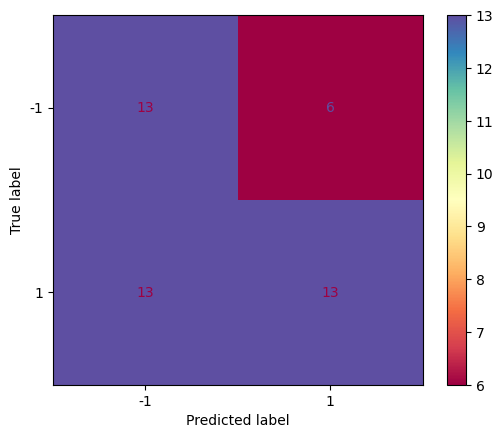

In [34]:
import sklearn
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split

MS003_X_data = ms003_inputs_V1
MS003_X_data = MS003_X_data.fillna(0)
Y_data = regret_by_subj['MS003']
MS003_Y_data = [(-1) if y == 0 else (1) for y in Y_data]


MS003_X_train, MS003_X_test, MS003_Y_train, MS003_Y_test = train_test_split(MS003_X_data,MS003_Y_data,test_size=0.3)


svc_V2 = SVC(C=1, kernel='linear')

# Define an SVM classifier (SVC) with a linear kernel
svc_V2.fit(MS003_X_train, MS003_Y_train)
#test accuracy on train data
MS003_y_pred = svc_V2.predict(MS003_X_test)

confusion_03 = metrics.confusion_matrix(MS003_Y_test,MS003_y_pred)
metrics.ConfusionMatrixDisplay.from_predictions(MS003_Y_test,MS003_y_pred,cmap='Spectral')

#classification_score
print(pd.DataFrame(metrics.classification_report(MS003_Y_test,MS003_y_pred, labels=np.unique(MS003_Y_test),output_dict=True)).T)

#accuracy_score
print('Accuracy Score:', metrics.accuracy_score(MS003_Y_test,MS003_y_pred))

#roc_auc_score
print('ROC AUC Score',metrics.roc_auc_score(MS003_Y_test,MS003_y_pred))

MS0016

              precision    recall  f1-score    support
-1             0.548387  0.850000  0.666667  20.000000
1              0.785714  0.440000  0.564103  25.000000
accuracy       0.622222  0.622222  0.622222   0.622222
macro avg      0.667051  0.645000  0.615385  45.000000
weighted avg   0.680236  0.622222  0.609687  45.000000
Accuracy Score: 0.6222222222222222
ROC AUC Score 0.645


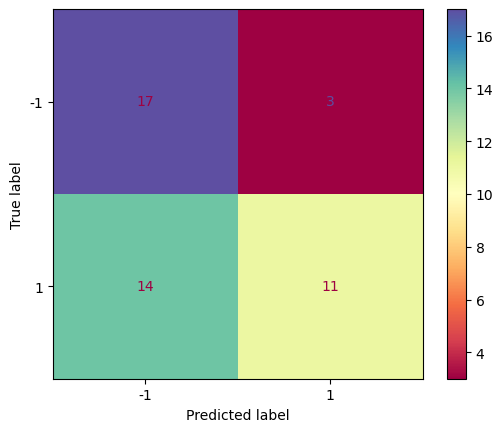

In [35]:
MS016_X_data = ms016_inputs_V1
MS016_X_data = MS016_X_data.fillna(0)
Y_data = regret_by_subj['MS016']
MS016_Y_data = [(-1) if y == 0 else (1) for y in Y_data]


MS016_X_train, MS016_X_test, MS016_Y_train, MS016_Y_test = train_test_split(MS016_X_data,MS016_Y_data,test_size=0.3)


svc_V2 = SVC(C=1, kernel='linear')
# Define an SVM classifier (SVC) with a linear kernel
svc_V2.fit(MS016_X_train, MS016_Y_train)


#test accuracy on train data
MS016_y_pred = svc_V2.predict(MS016_X_test)

confusion_16 = metrics.confusion_matrix(MS016_Y_test,MS016_y_pred)
metrics.ConfusionMatrixDisplay.from_predictions(MS016_Y_test,MS016_y_pred,cmap='Spectral')

#classification_score
print(pd.DataFrame(metrics.classification_report(MS016_Y_test,MS016_y_pred, labels=np.unique(MS016_Y_test),output_dict=True)).T)

#accuracy_score
print('Accuracy Score:', metrics.accuracy_score(MS016_Y_test,MS016_y_pred))

#roc_auc_score
print('ROC AUC Score',metrics.roc_auc_score(MS016_Y_test,MS016_y_pred))

MS017

              precision    recall  f1-score    support
-1             0.720000  0.666667  0.692308  27.000000
1              0.550000  0.611111  0.578947  18.000000
accuracy       0.644444  0.644444  0.644444   0.644444
macro avg      0.635000  0.638889  0.635628  45.000000
weighted avg   0.652000  0.644444  0.646964  45.000000
Accuracy Score: 0.6444444444444445
ROC AUC Score 0.638888888888889


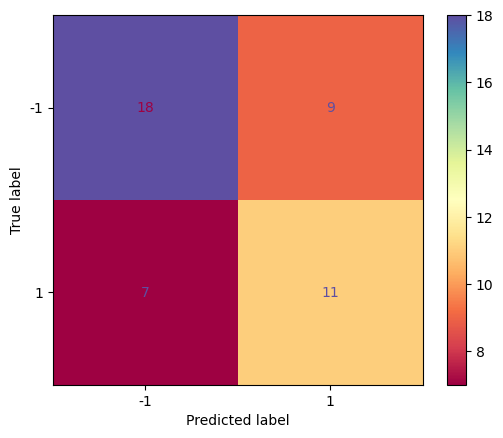

In [36]:
MS017_X_data = ms017_inputs_V1
MS017_X_data = MS017_X_data.fillna(0)
Y_data = regret_by_subj['MS017']
MS017_Y_data = [(-1) if y == 0 else (1) for y in Y_data]


MS017_X_train, MS017_X_test, MS017_Y_train, MS017_Y_test = train_test_split(MS017_X_data,MS017_Y_data,test_size=0.3)


svc_V2 = SVC(C=1, kernel='linear')
# Define an SVM classifier (SVC) with a linear kernel
svc_V2.fit(MS017_X_train, MS017_Y_train)


#test accuracy on train data
MS017_y_pred = svc_V2.predict(MS017_X_test)

confusion_17 = metrics.confusion_matrix(MS017_Y_test,MS017_y_pred)
metrics.ConfusionMatrixDisplay.from_predictions(MS017_Y_test,MS017_y_pred,cmap='Spectral')

#classification_score
print(pd.DataFrame(metrics.classification_report(MS017_Y_test,MS017_y_pred, labels=np.unique(MS017_Y_test),output_dict=True)).T)

#accuracy_score
print('Accuracy Score:', metrics.accuracy_score(MS017_Y_test,MS017_y_pred))

#roc_auc_score
print('ROC AUC Score',metrics.roc_auc_score(MS017_Y_test,MS017_y_pred))

MS019

              precision    recall  f1-score    support
-1             0.560000  0.560000  0.560000  25.000000
1              0.450000  0.450000  0.450000  20.000000
accuracy       0.511111  0.511111  0.511111   0.511111
macro avg      0.505000  0.505000  0.505000  45.000000
weighted avg   0.511111  0.511111  0.511111  45.000000
Accuracy Score: 0.5111111111111111
ROC AUC Score 0.505


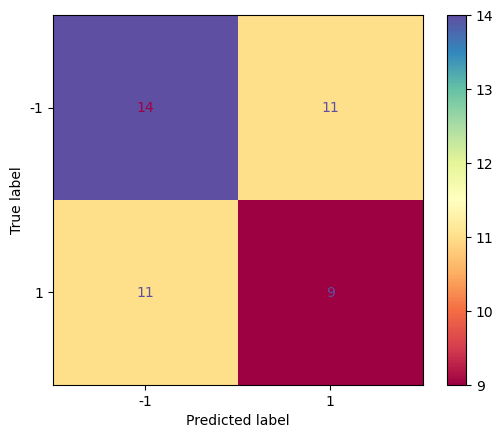

In [37]:
MS019_X_data = ms019_inputs_V1
MS019_X_data = MS019_X_data.fillna(0)
Y_data = regret_by_subj['MS019']
MS019_Y_data = [(-1) if y == 0 else (1) for y in Y_data]


MS019_X_train, MS019_X_test, MS019_Y_train, MS019_Y_test = train_test_split(MS019_X_data,MS019_Y_data,test_size=0.3)


svc_V2 = SVC(C=1, kernel='linear')
# Define an SVM classifier (SVC) with a linear kernel
svc_V2.fit(MS019_X_train, MS019_Y_train)


#test accuracy on train data
MS019_y_pred = svc_V2.predict(MS019_X_test)

confusion_19 = metrics.confusion_matrix(MS019_Y_test,MS019_y_pred)
metrics.ConfusionMatrixDisplay.from_predictions(MS019_Y_test,MS019_y_pred,cmap='Spectral')

#classification_score
print(pd.DataFrame(metrics.classification_report(MS019_Y_test,MS019_y_pred, labels=np.unique(MS019_Y_test),output_dict=True)).T)

#accuracy_score
print('Accuracy Score:', metrics.accuracy_score(MS019_Y_test,MS019_y_pred))

#roc_auc_score
print('ROC AUC Score',metrics.roc_auc_score(MS019_Y_test,MS019_y_pred))

MS020

              precision    recall  f1-score    support
-1             0.517241  0.600000  0.555556  25.000000
1              0.375000  0.300000  0.333333  20.000000
accuracy       0.466667  0.466667  0.466667   0.466667
macro avg      0.446121  0.450000  0.444444  45.000000
weighted avg   0.454023  0.466667  0.456790  45.000000
Accuracy Score: 0.4666666666666667
ROC AUC Score 0.45


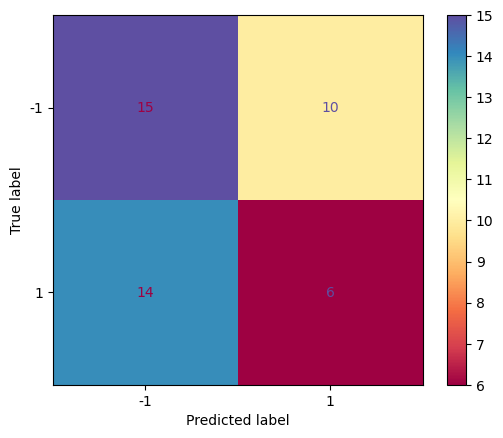

In [38]:
MS020_X_data = ms020_inputs_V1
MS020_X_data = MS020_X_data.fillna(0)
Y_data = regret_by_subj['MS020']
MS020_Y_data = [(-1) if y == 0 else (1) for y in Y_data]


MS020_X_train, MS020_X_test, MS020_Y_train, MS020_Y_test = train_test_split(MS020_X_data,MS020_Y_data,test_size=0.3)


svc_V2 = SVC(C=1, kernel='linear')
# Define an SVM classifier (SVC) with a linear kernel
svc_V2.fit(MS020_X_train, MS020_Y_train)


#test accuracy on train data
MS020_y_pred = svc_V2.predict(MS020_X_test)

confusion_20 = metrics.confusion_matrix(MS020_Y_test,MS020_y_pred)
metrics.ConfusionMatrixDisplay.from_predictions(MS020_Y_test,MS020_y_pred,cmap='Spectral')

#classification_score
print(pd.DataFrame(metrics.classification_report(MS020_Y_test,MS020_y_pred, labels=np.unique(MS020_Y_test),output_dict=True)).T)

#accuracy_score
print('Accuracy Score:', metrics.accuracy_score(MS020_Y_test,MS020_y_pred))

#roc_auc_score
print('ROC AUC Score',metrics.roc_auc_score(MS020_Y_test,MS020_y_pred))

## Single Subject SVM with Cross Validation of Data Splitting

In [58]:
from sklearn.model_selection import cross_val_score, ShuffleSplit

svc_V2 = SVC(C=1, kernel='linear')
cv = ShuffleSplit(n_splits=10,train_size = 0.7, test_size=0.3, random_state=42)

scores_full_MS003 = cross_val_score(svc_V2, MS003_X_data,MS003_Y_data, cv=cv, n_jobs=1)
print ("MS003 Classification score: %s (std. %s)" % (np.mean(scores_full_MS003), np.std(scores_full_MS003)))
class_balance_MS003 = sum(np.array(MS003_Y_data) == 1)/150
class_balance_MS003 = max(class_balance_MS003, 1. - class_balance_MS003)
print('MS003 Chance Level: ', class_balance_MS003)

scores_full_MS016 = cross_val_score(svc_V2, MS016_X_data,MS016_Y_data, cv=cv, n_jobs=1)
print ("MS016 Classification score: %s (std. %s)" % (np.mean(scores_full_MS016), np.std(scores_full_MS016)))
class_balance_MS016 = sum(np.array(MS016_Y_data) == 1)/150
class_balance_MS016 = max(class_balance_MS016, 1. - class_balance_MS016)
print('MS016 Chance Level: ', class_balance_MS016)

scores_full_MS017 = cross_val_score(svc_V2, MS017_X_data,MS017_Y_data, cv=cv, n_jobs=1)
print ("MS017 Classification score: %s (std. %s)" % (np.mean(scores_full_MS017), np.std(scores_full_MS017)))
class_balance_MS017 = sum(np.array(MS017_Y_data) == 1)/150
class_balance_MS017 = max(class_balance_MS017, 1. - class_balance_MS017)
print('MS017 Chance Level: ', class_balance_MS017)

scores_full_MS019 = cross_val_score(svc_V2, MS019_X_data,MS019_Y_data, cv=cv, n_jobs=1)
print ("MS019 Classification score: %s (std. %s)" % (np.mean(scores_full_MS019), np.std(scores_full_MS019)))
class_balance_MS019 = sum(np.array(MS019_Y_data) == 1)/150
class_balance_MS019 = max(class_balance_MS019, 1. - class_balance_MS019)
print('MS019 Chance Level: ', class_balance_MS019)

scores_full_MS020 = cross_val_score(svc_V2, MS020_X_data,MS020_Y_data, cv=cv, n_jobs=1)
print ("MS020 Classification score: %s (std. %s)" % (np.mean(scores_full_MS020), np.std(scores_full_MS020)))
class_balance_MS020 = sum(np.array(MS020_Y_data) == 1)/150
class_balance_MS020 = max(class_balance_MS020, 1. - class_balance_MS020)
print('MS020 Chance Level: ', class_balance_MS020)

MS003 Classification score: 0.651111111111111 (std. 0.061302729885038765)
MS003 Chance Level:  0.5066666666666667
MS016 Classification score: 0.5888888888888888 (std. 0.04581228472908512)
MS016 Chance Level:  0.5066666666666666
MS017 Classification score: 0.6288888888888888 (std. 0.04337604732431809)
MS017 Chance Level:  0.56
MS019 Classification score: 0.47333333333333333 (std. 0.06888888888888887)
MS019 Chance Level:  0.5066666666666666
MS020 Classification score: 0.47333333333333333 (std. 0.05883645464388323)
MS020 Chance Level:  0.5800000000000001


## Single Subject SVM with Hyperparameter Tuning Using Grid Search Cross Validation

In [60]:
from sklearn.model_selection import GridSearchCV

# defining hyperparameter range 
param_grid = {'C': [0.0001,0.001,0.01,0.1, 1, 10, 100],  
              'gamma': [100, 10, 1, 0.1, 0.01, 0.001, 0.0001],  
              'gamma':['scale', 'auto'],
              'kernel': ['linear']}
   
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose = 3,n_jobs=-1,return_train_score=True) 

MS003

In [61]:
grid_MS003 = GridSearchCV(SVC(), param_grid, refit = True, verbose = 1,n_jobs=-1,return_train_score=True) 
MS003_X_train, MS003_X_test, MS003_Y_train, MS003_Y_test = train_test_split(MS003_X_data,MS003_Y_data,test_size=0.3)
grid_MS003.fit(MS003_X_train, MS003_Y_train) 
 

Fitting 5 folds for each of 14 candidates, totalling 70 fits


GridSearchCV(estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                         'gamma': ['scale', 'auto'], 'kernel': ['linear']},
             return_train_score=True, verbose=1)

In [64]:
# print best parameter after tuning 
print('MS003',grid_MS003.best_params_) 
grid_MS003_predictions = grid_MS003.predict(MS003_X_test) 

MS003 {'C': 0.01, 'gamma': 'scale', 'kernel': 'linear'}


              precision    recall  f1-score  support
-1             0.523810  0.578947     0.550     19.0
1              0.666667  0.615385     0.640     26.0
accuracy       0.600000  0.600000     0.600      0.6
macro avg      0.595238  0.597166     0.595     45.0
weighted avg   0.606349  0.600000     0.602     45.0
Accuracy Score: 0.6
ROC AUC Score 0.597165991902834


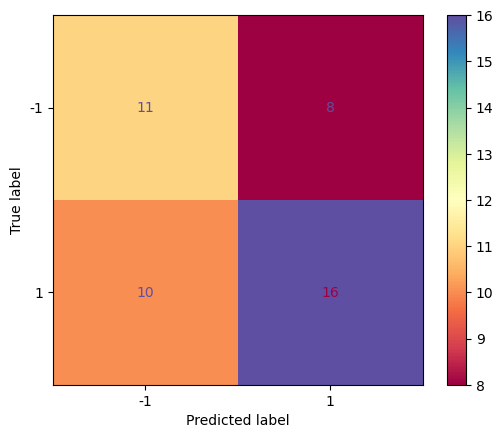

In [65]:
metrics.ConfusionMatrixDisplay.from_predictions(MS003_Y_test, grid_MS003_predictions,cmap='Spectral')
print(pd.DataFrame(metrics.classification_report(MS003_Y_test, grid_MS003_predictions, labels=np.unique(Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS003_Y_test, grid_MS003_predictions))
print('ROC AUC Score',metrics.roc_auc_score(MS003_Y_test, grid_MS003_predictions))

MS016

In [66]:
grid_MS016 = GridSearchCV(SVC(), param_grid, refit = True, verbose = 1,n_jobs=-1,return_train_score=True) 
MS016_X_train, MS016_X_test, MS016_Y_train, MS016_Y_test = train_test_split(MS016_X_data,MS016_Y_data,test_size=0.3)
grid_MS016.fit(MS016_X_train, MS016_Y_train) 


Fitting 5 folds for each of 14 candidates, totalling 70 fits


GridSearchCV(estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                         'gamma': ['scale', 'auto'], 'kernel': ['linear']},
             return_train_score=True, verbose=1)

In [67]:
print('MS016',grid_MS016.best_params_) 
grid_MS016_predictions = grid_MS016.predict(MS016_X_test) 

MS016 {'C': 0.001, 'gamma': 'scale', 'kernel': 'linear'}


              precision    recall  f1-score  support
-1             0.592593  0.695652     0.640     23.0
1              0.611111  0.500000     0.550     22.0
accuracy       0.600000  0.600000     0.600      0.6
macro avg      0.601852  0.597826     0.595     45.0
weighted avg   0.601646  0.600000     0.596     45.0
Accuracy Score: 0.6
ROC AUC Score 0.5978260869565217


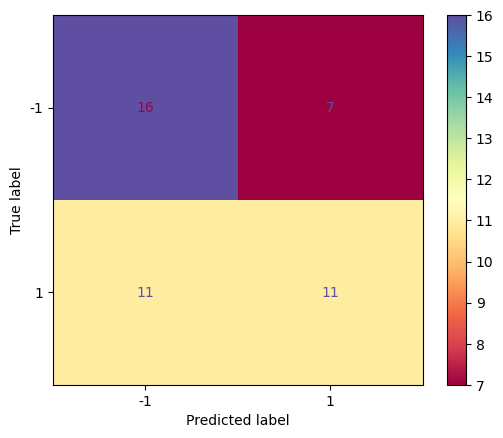

In [69]:
print(pd.DataFrame(metrics.classification_report(MS016_Y_test, grid_MS016_predictions, labels=np.unique(Y_test),output_dict=True)).T)
metrics.ConfusionMatrixDisplay.from_predictions(MS016_Y_test, grid_MS016_predictions,cmap='Spectral')
print('Accuracy Score:', metrics.accuracy_score(MS016_Y_test, grid_MS016_predictions))
print('ROC AUC Score',metrics.roc_auc_score(MS016_Y_test, grid_MS016_predictions))

MS017

In [70]:
grid_MS017 = GridSearchCV(SVC(), param_grid, refit = True, verbose = 1,n_jobs=-1,return_train_score=True) 
MS017_X_train, MS017_X_test, MS017_Y_train, MS017_Y_test = train_test_split(MS017_X_data,MS017_Y_data,test_size=0.3)
grid_MS017.fit(MS017_X_train, MS017_Y_train) 

Fitting 5 folds for each of 14 candidates, totalling 70 fits


GridSearchCV(estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                         'gamma': ['scale', 'auto'], 'kernel': ['linear']},
             return_train_score=True, verbose=1)

In [71]:
print('MS017',grid_MS017.best_params_) 
grid_MS017_predictions = grid_MS017.predict(MS017_X_test) 

MS017 {'C': 0.01, 'gamma': 'scale', 'kernel': 'linear'}


              precision    recall  f1-score    support
-1             0.576923  0.625000  0.600000  24.000000
1              0.526316  0.476190  0.500000  21.000000
accuracy       0.555556  0.555556  0.555556   0.555556
macro avg      0.551619  0.550595  0.550000  45.000000
weighted avg   0.553306  0.555556  0.553333  45.000000
Accuracy Score: 0.5555555555555556
ROC AUC Score 0.5505952380952381


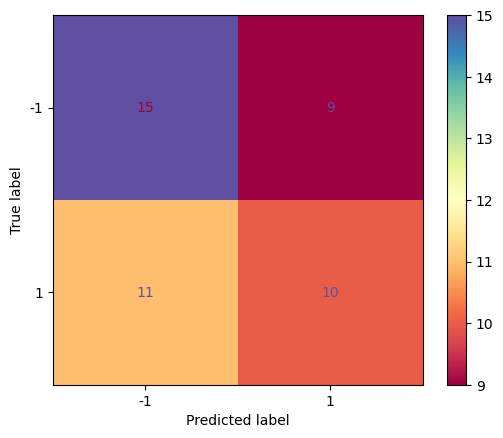

In [72]:
print(pd.DataFrame(metrics.classification_report(MS017_Y_test, grid_MS017_predictions, labels=np.unique(Y_test),output_dict=True)).T)
metrics.ConfusionMatrixDisplay.from_predictions(MS017_Y_test, grid_MS017_predictions,cmap='Spectral')
print('Accuracy Score:', metrics.accuracy_score(MS017_Y_test, grid_MS017_predictions))
print('ROC AUC Score',metrics.roc_auc_score(MS017_Y_test, grid_MS017_predictions))

MS019

In [73]:
grid_MS019 = GridSearchCV(SVC(), param_grid, refit = True, verbose = 1,n_jobs=-1,return_train_score=True) 
MS019_X_train, MS019_X_test, MS019_Y_train, MS019_Y_test = train_test_split(MS019_X_data,MS019_Y_data,test_size=0.3)
grid_MS019.fit(MS019_X_train, MS019_Y_train) 

Fitting 5 folds for each of 14 candidates, totalling 70 fits


GridSearchCV(estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                         'gamma': ['scale', 'auto'], 'kernel': ['linear']},
             return_train_score=True, verbose=1)

In [76]:
print('MS019 ',grid_MS019.best_params_) 
grid_MS019_predictions = grid_MS019.predict(MS019_X_test) 

MS019  {'C': 0.001, 'gamma': 'scale', 'kernel': 'linear'}


              precision    recall  f1-score    support
-1             0.533333  0.333333  0.410256  24.000000
1              0.466667  0.666667  0.549020  21.000000
accuracy       0.488889  0.488889  0.488889   0.488889
macro avg      0.500000  0.500000  0.479638  45.000000
weighted avg   0.502222  0.488889  0.475013  45.000000
Accuracy Score: 0.4888888888888889
ROC AUC Score 0.5


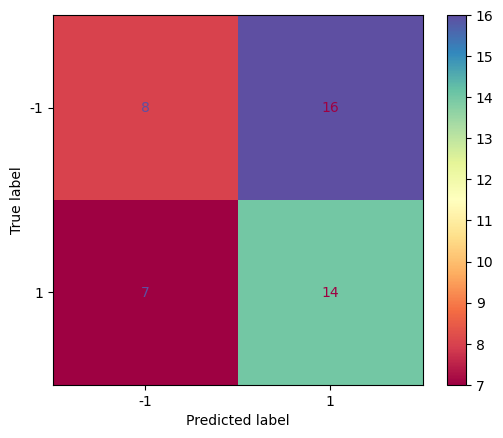

In [77]:
print(pd.DataFrame(metrics.classification_report(MS019_Y_test, grid_MS019_predictions, labels=np.unique(Y_test),output_dict=True)).T)
metrics.ConfusionMatrixDisplay.from_predictions(MS019_Y_test, grid_MS019_predictions,cmap='Spectral')
print('Accuracy Score:', metrics.accuracy_score(MS019_Y_test, grid_MS019_predictions))
print('ROC AUC Score',metrics.roc_auc_score(MS019_Y_test, grid_MS019_predictions))

MS020

In [86]:
grid_MS020 = GridSearchCV(SVC(), param_grid, refit = True, verbose = 1,n_jobs=-1,return_train_score=True) 
MS020_X_train, MS020_X_test, MS020_Y_train, MS020_Y_test = train_test_split(MS020_X_data,MS020_Y_data,test_size=0.3)
grid_MS020.fit(MS020_X_train, MS020_Y_train) 

Fitting 5 folds for each of 14 candidates, totalling 70 fits


GridSearchCV(estimator=SVC(), n_jobs=-1,
             param_grid={'C': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100],
                         'gamma': ['scale', 'auto'], 'kernel': ['linear']},
             return_train_score=True, verbose=1)

In [87]:
print('MS020 ',grid_MS020.best_params_) 
grid_MS020_predictions = grid_MS020.predict(MS020_X_test) 

MS020  {'C': 0.0001, 'gamma': 'scale', 'kernel': 'linear'}


              precision  recall  f1-score  support
-1                 0.60     1.0     0.750     27.0
1                  0.00     0.0     0.000     18.0
accuracy           0.60     0.6     0.600      0.6
macro avg          0.30     0.5     0.375     45.0
weighted avg       0.36     0.6     0.450     45.0
Accuracy Score: 0.6
ROC AUC Score 0.5


/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

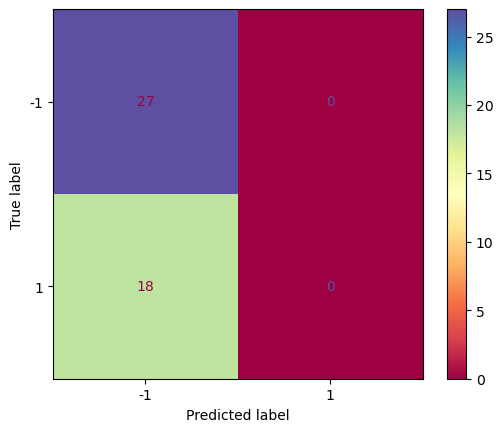

In [88]:
print(pd.DataFrame(metrics.classification_report(MS020_Y_test, grid_MS020_predictions, labels=np.unique(Y_test),output_dict=True)).T)
metrics.ConfusionMatrixDisplay.from_predictions(MS020_Y_test, grid_MS020_predictions,cmap='Spectral')
print('Accuracy Score:', metrics.accuracy_score(MS020_Y_test, grid_MS020_predictions))
print('ROC AUC Score',metrics.roc_auc_score(MS020_Y_test, grid_MS020_predictions))

## Single Subject SVM with Best GridSearch Hyperparameter and Cross Validation for Data Splitting

In [92]:
cv = ShuffleSplit(n_splits=10,train_size = 0.7, test_size=0.3)

ms003_svc_V3 = SVC(C=0.01, kernel='linear')
scores_full_MS003 = cross_val_score(ms003_svc_V3, MS003_X_data,MS003_Y_data, cv=cv, n_jobs=1)
print ("MS003 Classification score: %s (std. %s)" % (np.mean(scores_full_MS003), np.std(scores_full_MS003)))

ms016_svc_V3 = SVC(C=0.001, kernel='linear')
scores_full_MS016 = cross_val_score(ms016_svc_V3, MS016_X_data,MS016_Y_data, cv=cv, n_jobs=1)
print ("MS016 Classification score: %s (std. %s)" % (np.mean(scores_full_MS016), np.std(scores_full_MS016)))

ms017_svc_V3 = SVC(C=0.01, kernel='linear')
scores_full_MS017 = cross_val_score(ms017_svc_V3, MS017_X_data,MS017_Y_data, cv=cv, n_jobs=1)
print ("MS017 Classification score: %s (std. %s)" % (np.mean(scores_full_MS017), np.std(scores_full_MS017)))

ms019_svc_V3 = SVC(C=0.001, kernel='linear')
scores_full_MS019 = cross_val_score(ms019_svc_V3, MS019_X_data,MS019_Y_data, cv=cv, n_jobs=1)
print ("MS019 Classification score: %s (std. %s)" % (np.mean(scores_full_MS019), np.std(scores_full_MS019)))

ms020_svc_V3 = SVC(C=0.0001, kernel='linear')
scores_full_MS020 = cross_val_score(ms020_svc_V3, MS020_X_data,MS020_Y_data, cv=cv, n_jobs=1)
print ("MS020 Classification score: %s (std. %s)" % (np.mean(scores_full_MS020), np.std(scores_full_MS020)))

MS003 Classification score: 0.6422222222222222 (std. 0.09607096142763237)
MS016 Classification score: 0.5333333333333332 (std. 0.053518198127965745)
MS017 Classification score: 0.6288888888888888 (std. 0.059669873698211334)
MS019 Classification score: 0.49333333333333335 (std. 0.05515410509329269)
MS020 Classification score: 0.5577777777777777 (std. 0.047088044667593545)


In [39]:
MS003_X_train, MS003_X_test, MS003_Y_train, MS003_Y_test = train_test_split(MS003_X_data,MS003_Y_data,test_size=0.3)
MS016_X_train, MS016_X_test, MS016_Y_train, MS016_Y_test = train_test_split(MS016_X_data,MS016_Y_data,test_size=0.3)
MS017_X_train, MS017_X_test, MS017_Y_train, MS017_Y_test = train_test_split(MS017_X_data,MS017_Y_data,test_size=0.3)
MS019_X_train, MS019_X_test, MS019_Y_train, MS019_Y_test = train_test_split(MS019_X_data,MS019_Y_data,test_size=0.3)
MS020_X_train, MS020_X_test, MS020_Y_train, MS020_Y_test = train_test_split(MS020_X_data,MS020_Y_data,test_size=0.3)

ms003_svc_V3 = SVC(C=0.01, kernel='linear')

ms016_svc_V3 = SVC(C=0.01, kernel='linear')

ms017_svc_V3 = SVC(C=0.01, kernel='linear')

ms019_svc_V3 = SVC(C=0.01, kernel='linear')

ms020_svc_V3 = SVC(C=0.01, kernel='linear')


ms003_svc_V3.fit(MS003_X_train, MS003_Y_train)
ms016_svc_V3.fit(MS016_X_train, MS016_Y_train)
ms017_svc_V3.fit(MS017_X_train, MS017_Y_train)
ms019_svc_V3.fit(MS019_X_train, MS019_Y_train)
ms020_svc_V3.fit(MS020_X_train, MS020_Y_train)


MS003_y_pred = ms003_svc_V3.predict(MS003_X_test)
MS016_y_pred = ms016_svc_V3.predict(MS016_X_test)
MS017_y_pred = ms017_svc_V3.predict(MS017_X_test)
MS019_y_pred = ms019_svc_V3.predict(MS019_X_test)
MS020_y_pred = ms020_svc_V3.predict(MS020_X_test)


MS003

              precision    recall  f1-score  support
-1             0.842105  0.727273  0.780488     22.0
1              0.769231  0.869565  0.816327     23.0
accuracy       0.800000  0.800000  0.800000      0.8
macro avg      0.805668  0.798419  0.798407     45.0
weighted avg   0.804858  0.800000  0.798805     45.0
Accuracy Score: 0.8
ROC AUC Score 0.7984189723320158


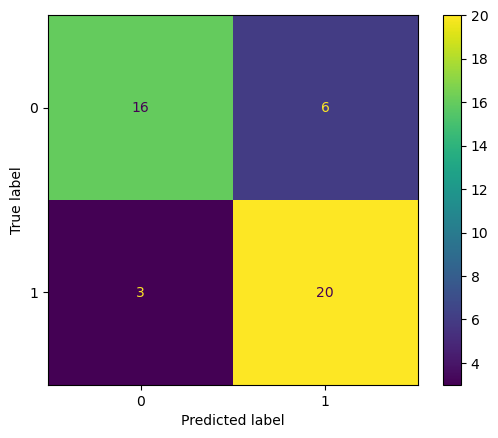

In [110]:
confusion_03 = metrics.confusion_matrix(MS003_Y_test,MS003_y_pred)
metrics.ConfusionMatrixDisplay(confusion_03).plot()
print(pd.DataFrame(metrics.classification_report(MS003_Y_test,MS003_y_pred, labels=np.unique(MS003_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS003_Y_test,MS003_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS003_Y_test,MS003_y_pred))

MS0016

              precision    recall  f1-score    support
-1             0.538462  0.560000  0.549020  25.000000
1              0.421053  0.400000  0.410256  20.000000
accuracy       0.488889  0.488889  0.488889   0.488889
macro avg      0.479757  0.480000  0.479638  45.000000
weighted avg   0.486280  0.488889  0.487347  45.000000
Accuracy Score: 0.4888888888888889
ROC AUC Score 0.48000000000000004


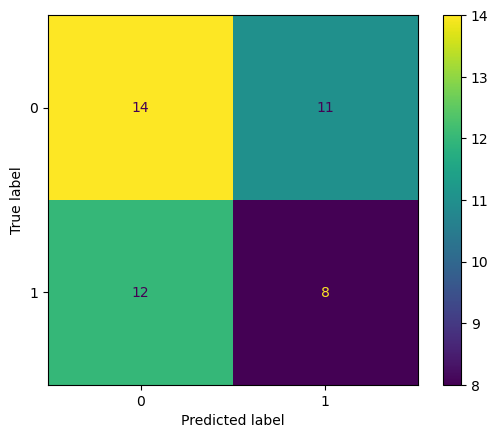

In [109]:
confusion_16 = metrics.confusion_matrix(MS016_Y_test,MS016_y_pred)
metrics.ConfusionMatrixDisplay(confusion_16).plot()
print(pd.DataFrame(metrics.classification_report(MS016_Y_test,MS016_y_pred, labels=np.unique(MS016_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS016_Y_test,MS016_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS016_Y_test,MS016_y_pred))

MS017

              precision    recall  f1-score    support
-1             0.758621  0.814815  0.785714  27.000000
1              0.687500  0.611111  0.647059  18.000000
accuracy       0.733333  0.733333  0.733333   0.733333
macro avg      0.723060  0.712963  0.716387  45.000000
weighted avg   0.730172  0.733333  0.730252  45.000000
Accuracy Score: 0.7333333333333333
ROC AUC Score 0.712962962962963


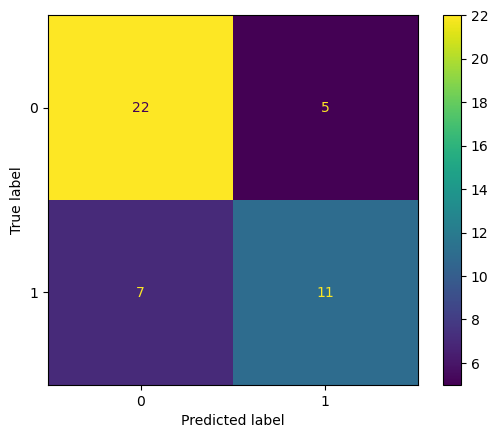

In [108]:
confusion_17 = metrics.confusion_matrix(MS017_Y_test,MS017_y_pred)
metrics.ConfusionMatrixDisplay(confusion_17).plot()
print(pd.DataFrame(metrics.classification_report(MS017_Y_test,MS017_y_pred, labels=np.unique(MS017_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS017_Y_test,MS017_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS017_Y_test,MS017_y_pred))

MS019

              precision    recall  f1-score    support
-1             0.545455  0.250000  0.342857  24.000000
1              0.470588  0.761905  0.581818  21.000000
accuracy       0.488889  0.488889  0.488889   0.488889
macro avg      0.508021  0.505952  0.462338  45.000000
weighted avg   0.510517  0.488889  0.454372  45.000000
Accuracy Score: 0.4888888888888889
ROC AUC Score 0.5059523809523809


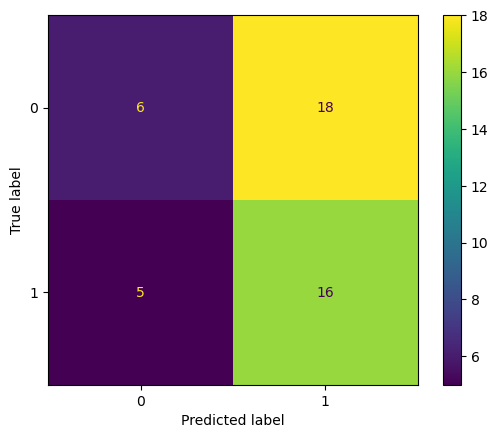

In [107]:
confusion_19 = metrics.confusion_matrix(MS019_Y_test,MS019_y_pred)
metrics.ConfusionMatrixDisplay(confusion_19).plot()
print(pd.DataFrame(metrics.classification_report(MS019_Y_test,MS019_y_pred, labels=np.unique(MS019_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS019_Y_test,MS019_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS019_Y_test,MS019_y_pred))

MS020

              precision    recall  f1-score    support
-1             0.657895  0.862069  0.746269  29.000000
1              0.428571  0.187500  0.260870  16.000000
accuracy       0.622222  0.622222  0.622222   0.622222
macro avg      0.543233  0.524784  0.503569  45.000000
weighted avg   0.576358  0.622222  0.573682  45.000000
Accuracy Score: 0.6222222222222222
ROC AUC Score 0.5247844827586207


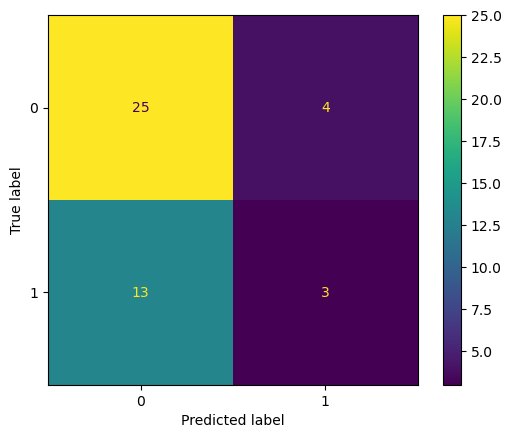

In [106]:
confusion_20 = metrics.confusion_matrix(MS020_Y_test,MS020_y_pred)
metrics.ConfusionMatrixDisplay(confusion_20).plot()
print(pd.DataFrame(metrics.classification_report(MS020_Y_test,MS020_y_pred, labels=np.unique(MS020_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS020_Y_test,MS020_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS020_Y_test,MS020_y_pred))

## SVM Modeling with Feature Selection

In [40]:
ms003_feat = ms003_key_inputs_V1
ms016_feat = ms016_key_inputs_V1
ms017_feat = ms017_key_inputs_V1
ms019_feat = ms019_key_inputs_V1
ms020_feat = ms020_key_inputs_V1

In [41]:
from matplotlib import pyplot as plt

def f_importances(coef, names):
    imp = coef
    imp,names = zip(*sorted(zip(imp,names)))
    imp_pos = imp[0:10]
    imp_neg = imp[-11:-1]
    names_pos = names[0:10]
    names_neg = names[-11:-1]
    return imp_pos, names_pos, imp_neg, names_neg



In [42]:
ms003_pos_coeff,ms003_pos_feat, ms003_neg_coeff, ms003_neg_feat = f_importances(ms003_svc_V3.coef_[0], ms003_feat)
ms016_pos_coeff,ms016_pos_feat, ms016_neg_coeff, ms016_neg_feat = f_importances(ms016_svc_V3.coef_[0], ms016_feat)
ms017_pos_coeff,ms017_pos_feat, ms017_neg_coeff, ms017_neg_feat = f_importances(ms017_svc_V3.coef_[0], ms017_feat)
ms019_pos_coeff,ms019_pos_feat, ms019_neg_coeff, ms019_neg_feat = f_importances(ms019_svc_V3.coef_[0], ms019_feat)
ms020_pos_coeff,ms020_pos_feat, ms020_neg_coeff, ms020_neg_feat = f_importances(ms020_svc_V3.coef_[0], ms020_feat)

In [43]:
imp_features_dict = {}
imp_features_dict['MS003'] = ms003_pos_feat, ms003_neg_feat
imp_features_dict['MS016'] = ms016_pos_feat, ms016_neg_feat
imp_features_dict['MS017'] = ms017_pos_feat, ms017_neg_feat
imp_features_dict['MS019'] = ms019_pos_feat, ms019_neg_feat
imp_features_dict['MS020'] = ms020_pos_feat, ms020_neg_feat


In [44]:
# Extracting Anatomical Reconstruction Information for Relevant Anatomical Features 
subj_ids = ['MS003', 'MS016','MS017','MS019','MS020']
base_dir = '/Users/alexandrafink/Documents/GraduateSchool/Classes/ML/final_proj/'
anat_path = base_dir + '/data/anat/'


imp_roi_pos = []
imp_roi_neg = []
imp_elec_pos = []
imp_elec_neg = []
imp_freq_pos = []
imp_freq_neg = []


for ix,subj_id in enumerate(subj_ids):
    elec_file = anat_path + subj_id + '_labels.csv'
    elec_data = pd.read_csv(elec_file)
    elec_data = elec_data.rename(columns={'NMMlabel':'label'})


    pos_features = imp_features_dict[subj_id][0]
    neg_features = imp_features_dict[subj_id][1]

    for i in range(len(pos_features)):
        pos_freq = pos_features[i].split(':')[0]
        neg_freq = neg_features[i].split(':')[0]

        pos_elec = pos_features[i].split(':')[1]
        neg_elec = neg_features[i].split(':')[1]
        
        imp_freq_pos.append(pos_freq)
        imp_freq_neg.append(neg_freq)
        imp_elec_pos.append(pos_elec)
        imp_elec_neg.append(neg_elec)

        yba_pos = elec_data.YBA_1[np.where(elec_data.label.str.lower()==pos_elec)[0][0]].lower()
        yba_neg = elec_data.YBA_1[np.where(elec_data.label.str.lower()==neg_elec)[0][0]].lower()

        if yba_pos == 'unknown':
            yba_pos = elec_data['Manual Examination'][np.where(elec_data.label.str.lower()==pos_elec)[0][0]].lower()
        if yba_neg == 'unknown':
            yba_neg = elec_data['Manual Examination'][np.where(elec_data.label.str.lower()==neg_elec)[0][0]].lower()
        
        imp_roi_pos.append(yba_pos)
        imp_roi_neg.append(yba_neg)
        


In [45]:
rois = ['motor','orbital','cingulate','insular','amygdala','hippocampus']

region_pos = []
region_neg = []

for region in rois:
    for r in range(len(imp_roi_pos)):
        rpos = np.intersect1d(imp_roi_pos[r].split(),rois)
        rneg = np.intersect1d(imp_roi_neg[r].split(),rois)
        if any(rpos):
            region_pos.append(rpos[0])
        if any(rneg):
            region_neg.append(rneg[0])

<AxesSubplot: title={'center': 'ROIs Important for Positive Class'}, xlabel='Region'>

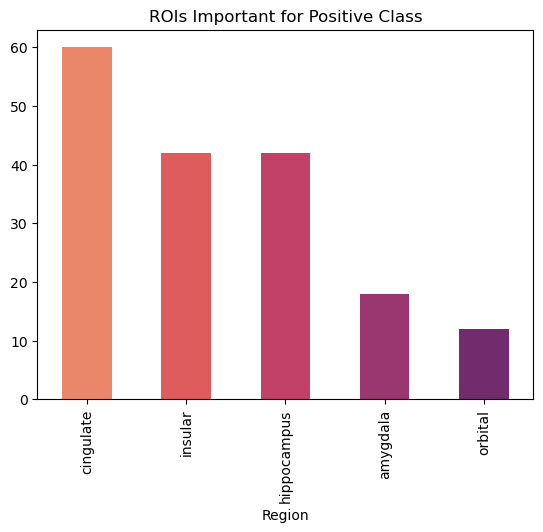

In [327]:
import seaborn as sns 
from collections import Counter, OrderedDict
region_pos_counts = Counter(region_pos)
region_pos_counts = OrderedDict(region_pos_counts.most_common())
df = pd.DataFrame.from_dict(region_pos_counts,orient='index')
df = df.rename(columns={0:'Counts'})
df = df.rename_axis(index='Region')
rgb_values = sns.color_palette("flare", 5)
df['Counts'].plot(x=list(df.index),kind='bar',title='ROIs Important for Positive Class', color = rgb_values, legend = False)


<AxesSubplot: title={'center': 'ROIs Important for Negative Class'}, xlabel='Region'>

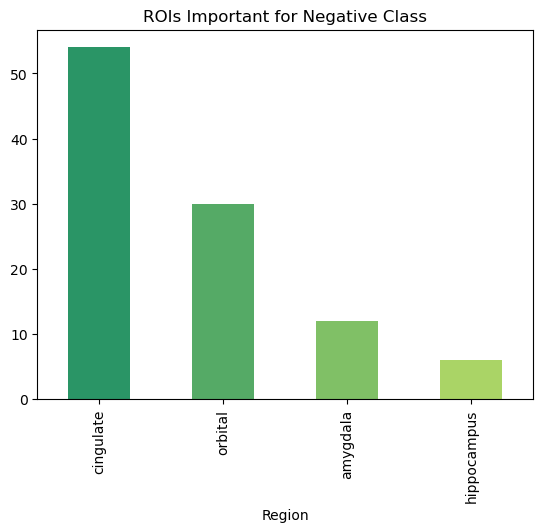

In [46]:
import seaborn as sns 
from collections import Counter, OrderedDict
region_neg_counts = Counter(region_neg)
region_neg_counts = OrderedDict(region_neg_counts.most_common())
df = pd.DataFrame.from_dict(region_neg_counts, orient='index')
df = df.rename(columns={0:'Counts'})
df = df.rename_axis(index='Region')
rgb_values = sns.color_palette("summer", 5)
df['Counts'].plot(x=list(df.index),kind='bar',title='ROIs Important for Negative Class', color = rgb_values, legend = False)


<AxesSubplot: title={'center': 'Frequencies Important for Positive Class'}, xlabel='Frequency'>

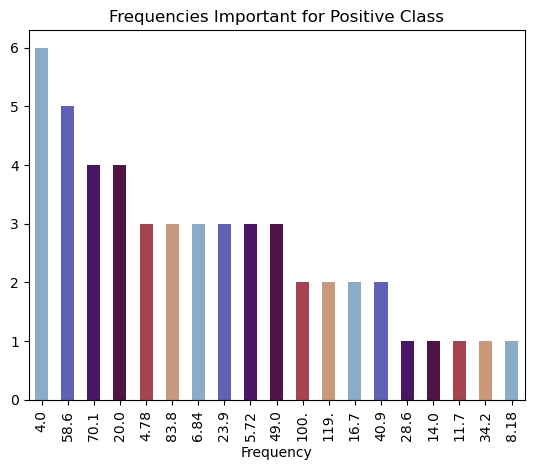

In [47]:
import pandas as pd
from collections import Counter, OrderedDict
imp_freq_plot = [f[:4] for f in imp_freq_pos]
imp_freq_pos_counts = Counter(imp_freq_plot)
imp_freq_pos_counts = OrderedDict(imp_freq_pos_counts.most_common())
df = pd.DataFrame.from_dict(imp_freq_pos_counts, orient='index')
df = df.rename(columns={0:'Counts'})
df = df.rename_axis(index='Frequency')
rgb_values = sns.color_palette("twilight")
df['Counts'].plot(x=list(df.index),kind='bar',title='Frequencies Important for Positive Class',color = rgb_values, legend=False)



<AxesSubplot: title={'center': 'Frequencies Important for Negative Class'}, xlabel='Frequency'>

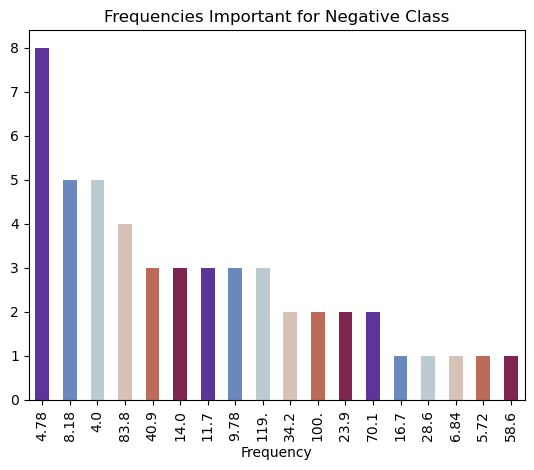

In [332]:
import pandas as pd
from collections import Counter, OrderedDict
imp_freq_plot = [f[:4] for f in imp_freq_neg]
imp_freq_neg_counts = Counter(imp_freq_plot)
imp_freq_neg_counts = OrderedDict(imp_freq_neg_counts.most_common())
df = pd.DataFrame.from_dict(imp_freq_neg_counts, orient='index')
df = df.rename(columns={0:'Counts'})
df = df.rename_axis(index='Frequency')
rgb_values = sns.color_palette("twilight_shifted")
df['Counts'].plot(x=list(df.index),kind='bar',title='Frequencies Important for Negative Class',color = rgb_values, legend=False)


## SVM with Important Features

In [48]:
def reduce_importances(coef, names):
    imp = coef
    imp,names = zip(*sorted(zip(imp,names)))
    imp_pos = imp[0:10]
    imp_neg = imp[-11:-1]
    imp_all = imp_pos + imp_neg
    names_pos = names[0:10]
    names_neg = names[-11:-1]
    names_all = names_pos + names_neg
    return imp_all, names_all

In [49]:
ms003_coeff, ms003_feat = reduce_importances(ms003_svc_V3.coef_[0], ms003_feat)
ms016_coeff, ms016_feat = reduce_importances(ms016_svc_V3.coef_[0], ms016_feat)
ms017_coeff, ms017_feat = reduce_importances(ms017_svc_V3.coef_[0], ms017_feat)
ms019_coeff, ms019_feat = reduce_importances(ms019_svc_V3.coef_[0], ms019_feat)
ms020_coeff, ms020_feat = reduce_importances(ms020_svc_V3.coef_[0], ms020_feat)

In [50]:
MS003_X_reduc = MS003_X_data[np.intersect1d(list(ms003_feat),list(MS003_X_data.columns))]
MS016_X_reduc = MS016_X_data[np.intersect1d(list(ms016_feat),list(MS016_X_data.columns))]
MS017_X_reduc = MS017_X_data[np.intersect1d(list(ms017_feat),list(MS017_X_data.columns))]
MS019_X_reduc = MS019_X_data[np.intersect1d(list(ms019_feat),list(MS019_X_data.columns))]
MS020_X_reduc = MS020_X_data[np.intersect1d(list(ms020_feat),list(MS020_X_data.columns))]

In [51]:
MS003_X_train, MS003_X_test, MS003_Y_train, MS003_Y_test = train_test_split(MS003_X_reduc,MS003_Y_data,test_size=0.3)
MS016_X_train, MS016_X_test, MS016_Y_train, MS016_Y_test = train_test_split(MS016_X_reduc,MS016_Y_data,test_size=0.3)
MS017_X_train, MS017_X_test, MS017_Y_train, MS017_Y_test = train_test_split(MS017_X_reduc,MS017_Y_data,test_size=0.3)
MS019_X_train, MS019_X_test, MS019_Y_train, MS019_Y_test = train_test_split(MS019_X_reduc,MS019_Y_data,test_size=0.3)
MS020_X_train, MS020_X_test, MS020_Y_train, MS020_Y_test = train_test_split(MS020_X_reduc,MS020_Y_data,test_size=0.3)


In [56]:
ms003_svc_V4 = SVC(C=0.01, kernel='linear')

ms016_svc_V4 = SVC(C=0.01, kernel='linear')

ms017_svc_V4 = SVC(C=0.01, kernel='linear')

ms019_svc_V4 = SVC(C=0.01, kernel='linear')

ms020_svc_V4 = SVC(C=0.01, kernel='linear')

In [57]:
# Define an SVM classifier (SVC) with a linear kernel
ms003_svc_V4.fit(MS003_X_train, MS003_Y_train)
ms016_svc_V4.fit(MS016_X_train, MS016_Y_train)
ms017_svc_V4.fit(MS017_X_train, MS017_Y_train)
ms019_svc_V4.fit(MS019_X_train, MS019_Y_train)
ms020_svc_V4.fit(MS020_X_train, MS020_Y_train)

SVC(C=0.01, kernel='linear')

In [58]:
#test accuracy on train data
MS003_y_pred = ms003_svc_V4.predict(MS003_X_test)
MS016_y_pred = ms016_svc_V4.predict(MS016_X_test)
MS017_y_pred = ms017_svc_V4.predict(MS017_X_test)
MS019_y_pred = ms019_svc_V4.predict(MS019_X_test)
MS020_y_pred = ms020_svc_V4.predict(MS020_X_test)


              precision    recall  f1-score    support
-1             0.866667  0.565217  0.684211  23.000000
1              0.666667  0.909091  0.769231  22.000000
accuracy       0.733333  0.733333  0.733333   0.733333
macro avg      0.766667  0.737154  0.726721  45.000000
weighted avg   0.768889  0.733333  0.725776  45.000000
Accuracy Score: 0.7333333333333333
ROC AUC Score 0.7371541501976285


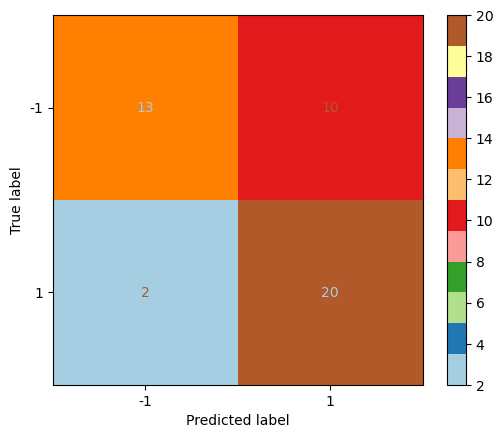

In [68]:
metrics.ConfusionMatrixDisplay.from_predictions(MS003_Y_test,MS003_y_pred,cmap='Paired')
print(pd.DataFrame(metrics.classification_report(MS003_Y_test,MS003_y_pred, labels=np.unique(MS003_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS003_Y_test,MS003_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS003_Y_test,MS003_y_pred))

              precision    recall  f1-score    support
-1             0.435897  0.944444  0.596491  18.000000
1              0.833333  0.185185  0.303030  27.000000
accuracy       0.488889  0.488889  0.488889   0.488889
macro avg      0.634615  0.564815  0.449761  45.000000
weighted avg   0.674359  0.488889  0.420415  45.000000
Accuracy Score: 0.4888888888888889
ROC AUC Score 0.5648148148148148


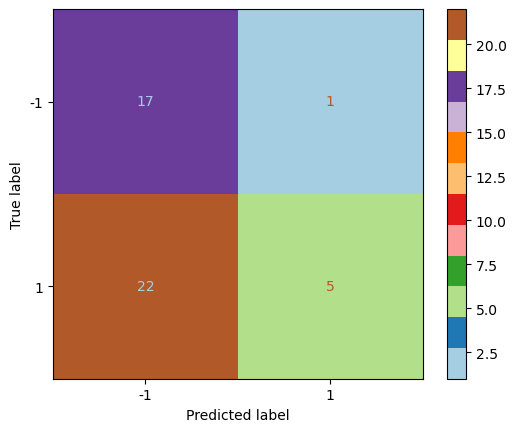

In [67]:
metrics.ConfusionMatrixDisplay.from_predictions(MS016_Y_test,MS016_y_pred,cmap='Paired')
print(pd.DataFrame(metrics.classification_report(MS016_Y_test,MS016_y_pred, labels=np.unique(MS016_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS016_Y_test,MS016_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS016_Y_test,MS016_y_pred))

              precision    recall  f1-score  support
-1             0.621622  0.851852  0.718750     27.0
1              0.500000  0.222222  0.307692     18.0
accuracy       0.600000  0.600000  0.600000      0.6
macro avg      0.560811  0.537037  0.513221     45.0
weighted avg   0.572973  0.600000  0.554327     45.0
Accuracy Score: 0.6
ROC AUC Score 0.5370370370370371


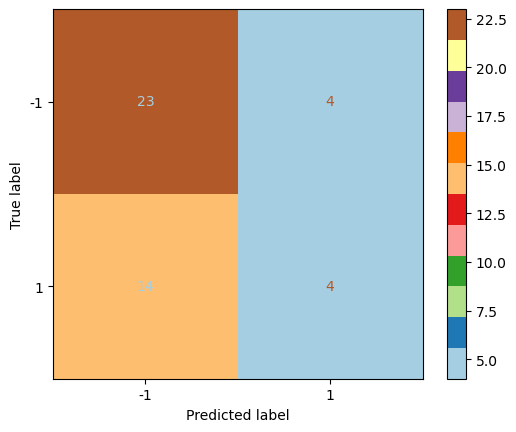

In [66]:
metrics.ConfusionMatrixDisplay.from_predictions(MS017_Y_test,MS017_y_pred,cmap='Paired')
print(pd.DataFrame(metrics.classification_report(MS017_Y_test,MS017_y_pred, labels=np.unique(MS017_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS017_Y_test,MS017_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS017_Y_test,MS017_y_pred))

              precision    recall  f1-score    support
-1             0.377778  1.000000  0.548387  17.000000
1              0.000000  0.000000  0.000000  28.000000
accuracy       0.377778  0.377778  0.377778   0.377778
macro avg      0.188889  0.500000  0.274194  45.000000
weighted avg   0.142716  0.377778  0.207168  45.000000
Accuracy Score: 0.37777777777777777
ROC AUC Score 0.5


/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

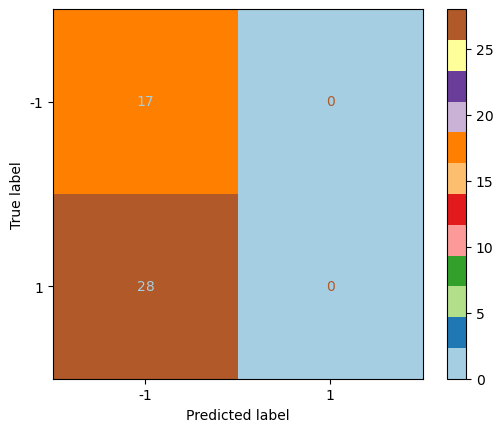

In [65]:
metrics.ConfusionMatrixDisplay.from_predictions(MS019_Y_test,MS019_y_pred,cmap='Paired')
print(pd.DataFrame(metrics.classification_report(MS019_Y_test,MS019_y_pred, labels=np.unique(MS019_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS019_Y_test,MS019_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS019_Y_test,MS019_y_pred))

              precision    recall  f1-score    support
-1             0.555556  1.000000  0.714286  25.000000
1              0.000000  0.000000  0.000000  20.000000
accuracy       0.555556  0.555556  0.555556   0.555556
macro avg      0.277778  0.500000  0.357143  45.000000
weighted avg   0.308642  0.555556  0.396825  45.000000
Accuracy Score: 0.5555555555555556
ROC AUC Score 0.5


/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/Users/alexandrafink/opt/anaconda3/envs/ml_bms_2023/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavi

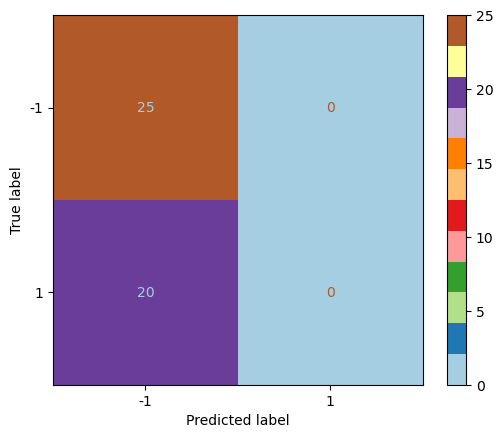

In [63]:
metrics.ConfusionMatrixDisplay.from_predictions(MS020_Y_test,MS020_y_pred,cmap='Paired')
print(pd.DataFrame(metrics.classification_report(MS020_Y_test,MS020_y_pred, labels=np.unique(MS020_Y_test),output_dict=True)).T)
print('Accuracy Score:', metrics.accuracy_score(MS020_Y_test,MS020_y_pred))
print('ROC AUC Score',metrics.roc_auc_score(MS020_Y_test,MS020_y_pred))

# Random Forest Classification:

In [69]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import f_classif, SelectPercentile
from sklearn.pipeline import Pipeline



clf = Pipeline([
    ('feature_selection', SelectPercentile(f_classif, percentile=5)),
    ('classification', RandomForestClassifier())
])

# specify parameters and distributions to sample from
param_dist = {"classification__n_estimators": [10, 100, 500, 1000],
              "classification__max_depth": [3, None],
              "classification__bootstrap": [True, False],
              "classification__criterion": ["gini", "entropy",'log_loss']}


In [70]:
MS003_X_train, MS003_X_test, MS003_Y_train, MS003_Y_test = train_test_split(MS003_X_data,MS003_Y_data,test_size=0.3)
MS016_X_train, MS016_X_test, MS016_Y_train, MS016_Y_test = train_test_split(MS016_X_data,MS016_Y_data,test_size=0.3)
MS017_X_train, MS017_X_test, MS017_Y_train, MS017_Y_test = train_test_split(MS017_X_data,MS017_Y_data,test_size=0.3)
MS019_X_train, MS019_X_test, MS019_Y_train, MS019_Y_test = train_test_split(MS019_X_data,MS019_Y_data,test_size=0.3)
MS020_X_train, MS020_X_test, MS020_Y_train, MS020_Y_test = train_test_split(MS020_X_data,MS020_Y_data,test_size=0.3)

MS003

In [71]:
# run randomized search
n_iter_search = 48
rs_indep_test = RandomizedSearchCV(clf, 
                                   param_distributions=param_dist,
                                   n_iter=n_iter_search, 
                                   cv=10, 
                                   scoring='roc_auc')
rs_indep_test.fit(MS003_X_train, MS003_Y_train)
print('Best 10-fold CV AUC score:', rs_indep_test.best_score_)

Best 10-fold CV AUC score: 0.8056666666666666


In [72]:
ms003_test_score = rs_indep_test.score(MS003_X_test, MS003_Y_test)
print('MS003 Test AUC score:', ms003_test_score)
print('MS003 Random Forest Params: ', rs_indep_test.best_params_)

MS003 Test AUC score: 0.7509881422924901
MS003 Random Forest Params:  {'classification__n_estimators': 10, 'classification__max_depth': None, 'classification__criterion': 'gini', 'classification__bootstrap': False}


In [87]:
importances = ms003_rand_forest.feature_importances_
sum(importances !=0)


357

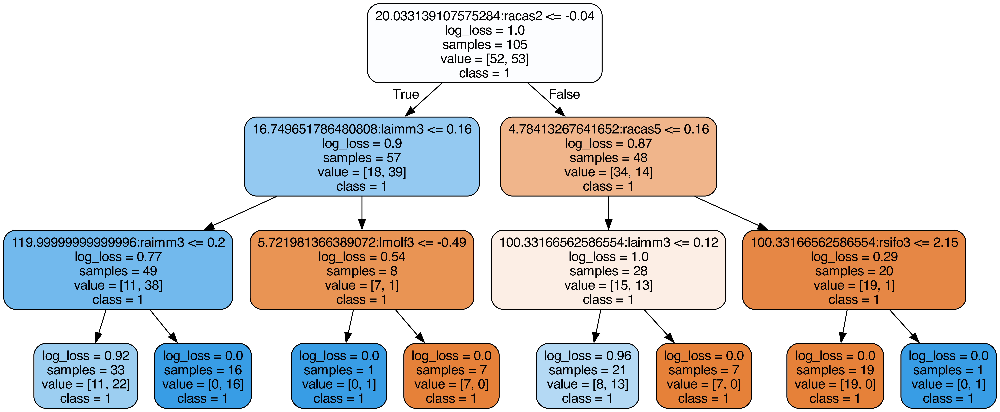

In [77]:
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier

ms003_rand_forest = RandomForestClassifier(n_estimators=100,
                                max_depth=3,
                                criterion='log_loss',
                                bootstrap=False)

ms003_rand_forest.fit(MS003_X_train, MS003_Y_train)

ms003_estimator = ms003_rand_forest.estimators_[50] #single tree


fn=list(MS003_X_train.columns)
cn= list(map(str, MS003_Y_train))


# Export as dot file
export_graphviz(ms003_estimator, 
                out_file='tree.dot', 
                feature_names = fn,
                class_names = cn,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

MS016

In [88]:
# run randomized search
n_iter_search = 48
rs16_indep_test = RandomizedSearchCV(clf, 
                                   param_distributions=param_dist,
                                   n_iter=n_iter_search, 
                                   cv=10, 
                                   scoring='roc_auc')
rs16_indep_test.fit(MS016_X_train, MS016_Y_train)
print('MS016 Best 10-fold CV AUC score:', rs16_indep_test.best_score_)

MS016 Best 10-fold CV AUC score: 0.6913333333333334


In [89]:
ms016_test_score = rs16_indep_test.score(MS016_X_test, MS016_Y_test)
print('MS016 Test AUC score:', ms016_test_score)
print('MS016 Random Forest Params: ', rs16_indep_test.best_params_)

MS016 Test AUC score: 0.5474308300395258
MS016 Random Forest Params:  {'classification__n_estimators': 10, 'classification__max_depth': 3, 'classification__criterion': 'log_loss', 'classification__bootstrap': False}


In [91]:
ms016_rand_forest = RandomForestClassifier(n_estimators=100,
                                max_depth=None,
                                criterion='log_loss',
                                bootstrap=False)

ms016_rand_forest.fit(MS016_X_train, MS016_Y_train)

importances = ms016_rand_forest.feature_importances_
sum(importances !=0)

934

In [528]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz


ms016_rand_forest = RandomForestClassifier(n_estimators=100,
                                max_depth=None,
                                criterion='log_loss',
                                bootstrap=False)

ms016_rand_forest.fit(MS016_X_train, MS016_Y_train)

ms016_estimator = ms016_rand_forest.estimators_[50] #single tree


fn=list(MS016_X_train.columns)
cn= list(map(str, MS016_Y_train))


# Export as dot file
export_graphviz(ms016_estimator, 
                out_file='tree.dot', 
                feature_names = fn,
                class_names = cn,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

MS017

In [94]:
# run randomized search
n_iter_search = 48
rs17_indep_test = RandomizedSearchCV(clf, 
                                   param_distributions=param_dist,
                                   n_iter=n_iter_search, 
                                   cv=10, 
                                   scoring='roc_auc')
rs17_indep_test.fit(MS017_X_train, MS017_Y_train)
print('MS017 est 10-fold CV AUC score:', rs17_indep_test.best_score_)

MS017 est 10-fold CV AUC score: 0.6873333333333334


In [95]:
ms017_test_score = rs17_indep_test.score(MS017_X_test, MS017_Y_test)
print('MS017 Test AUC score:', ms017_test_score)
print('MS017 Random Forest Params: ', rs17_indep_test.best_params_)

MS017 Test AUC score: 0.5021008403361344
MS017 Random Forest Params:  {'classification__n_estimators': 10, 'classification__max_depth': None, 'classification__criterion': 'entropy', 'classification__bootstrap': False}


In [96]:
ms017_rand_forest = RandomForestClassifier(n_estimators=10,
                                max_depth=None,
                                criterion='entropy',
                                bootstrap=False)

ms017_rand_forest.fit(MS017_X_train, MS017_Y_train)
importances = ms017_rand_forest.feature_importances_
sum(importances !=0)

132

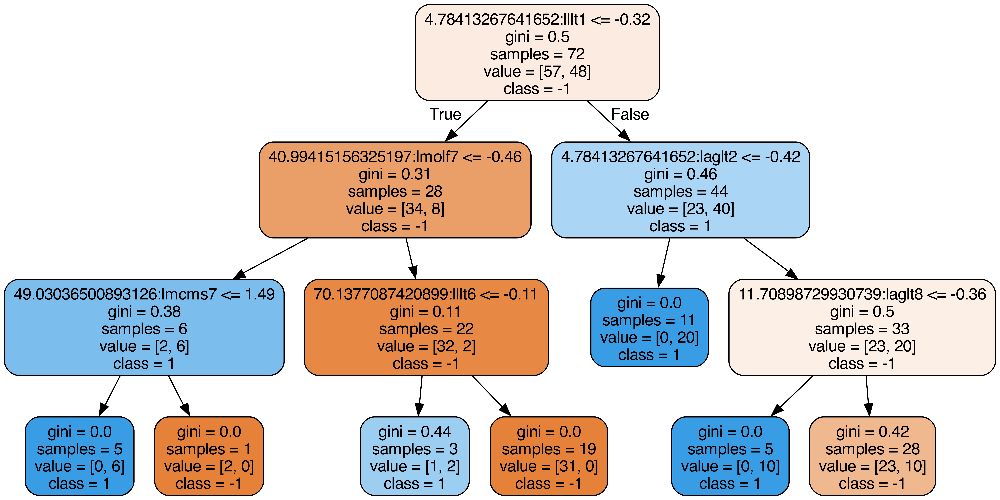

In [531]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz


ms017_rand_forest = RandomForestClassifier(n_estimators=1000,
                                max_depth=3,
                                criterion='gini',
                                bootstrap=True)

ms017_rand_forest.fit(MS017_X_train, MS017_Y_train)

ms017_estimator = ms017_rand_forest.estimators_[500] #single tree


fn=list(MS017_X_train.columns)
cn= list(map(str, MS017_Y_train))


# Export as dot file
export_graphviz(ms017_estimator, 
                out_file='tree.dot', 
                feature_names = fn,
                class_names = cn,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

MS019

In [532]:
# run randomized search
n_iter_search = 48
rs19_indep_test = RandomizedSearchCV(clf, 
                                   param_distributions=param_dist,
                                   n_iter=n_iter_search, 
                                   cv=10, 
                                   scoring='roc_auc')
rs19_indep_test.fit(MS019_X_train, MS019_Y_train)
print('MS019 Best 10-fold CV AUC score:', rs19_indep_test.best_score_)

MS019 Best 10-fold CV AUC score: 0.5546666666666666


In [533]:
ms019_test_score = rs19_indep_test.score(MS019_X_test, MS019_Y_test)
print('MS019 Test AUC score:', ms019_test_score)
print('MS019 Random Forest Params: ', rs19_indep_test.best_params_)

MS019 Test AUC score: 0.5098814229249011
MS019 Random Forest Params:  {'classification__n_estimators': 10, 'classification__max_depth': 3, 'classification__criterion': 'gini', 'classification__bootstrap': True}


In [97]:
ms019_rand_forest = RandomForestClassifier(n_estimators=10,
                                max_depth=3,
                                criterion='gini',
                                bootstrap=True)

ms019_rand_forest.fit(MS019_X_train, MS019_Y_train)
importances = ms019_rand_forest.feature_importances_
sum(importances !=0)

55

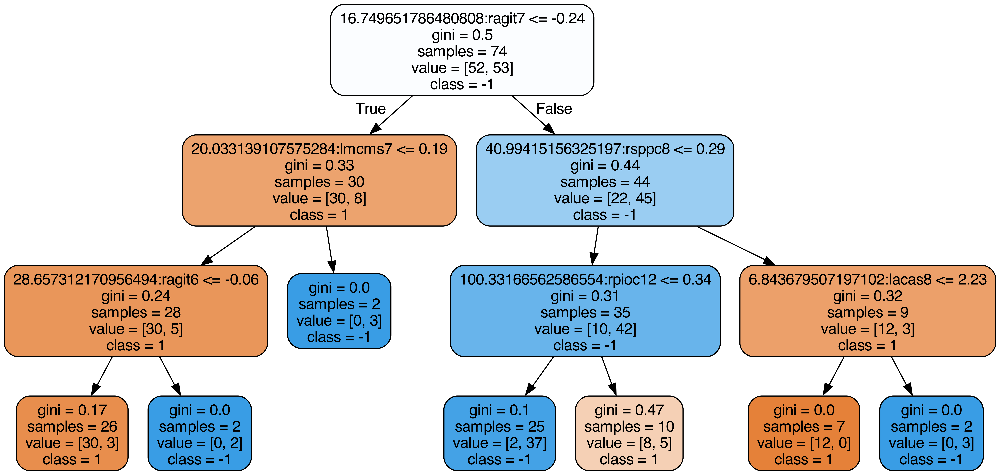

In [534]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz


ms019_rand_forest = RandomForestClassifier(n_estimators=10,
                                max_depth=3,
                                criterion='gini',
                                bootstrap=True)

ms019_rand_forest.fit(MS019_X_train, MS019_Y_train)

ms019_estimator = ms019_rand_forest.estimators_[5] #single tree


fn=list(MS019_X_train.columns)
cn= list(map(str, MS019_Y_train))


# Export as dot file
export_graphviz(ms019_estimator, 
                out_file='tree.dot', 
                feature_names = fn,
                class_names = cn,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

MS020

In [535]:
# run randomized search
n_iter_search = 48
rs20_indep_test = RandomizedSearchCV(clf, 
                                   param_distributions=param_dist,
                                   n_iter=n_iter_search, 
                                   cv=10, 
                                   scoring='roc_auc')
rs20_indep_test.fit(MS020_X_train, MS020_Y_train)
print('MS020 Best 10-fold CV AUC score:', rs20_indep_test.best_score_)

MS020 Best 10-fold CV AUC score: 0.5632738095238095


In [536]:
ms020_test_score = rs20_indep_test.score(MS020_X_test, MS020_Y_test)
print('MS020 Test AUC score:', ms020_test_score)
print('MS020 Random Forest Params: ', rs20_indep_test.best_params_)
#print()

MS020 Test AUC score: 0.37003968253968256
MS020 Random Forest Params:  {'classification__n_estimators': 10, 'classification__max_depth': None, 'classification__criterion': 'log_loss', 'classification__bootstrap': True}


In [98]:
ms020_rand_forest = RandomForestClassifier(n_estimators=10,
                                max_depth=None,
                                criterion='log_loss',
                                bootstrap=True)

ms020_rand_forest.fit(MS020_X_train, MS020_Y_train)
importances = ms020_rand_forest.feature_importances_
sum(importances !=0)

111

In [537]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import export_graphviz


ms020_rand_forest = RandomForestClassifier(n_estimators=10,
                                max_depth=None,
                                criterion='log_loss',
                                bootstrap=True)

ms020_rand_forest.fit(MS020_X_train, MS020_Y_train)

ms020_estimator = ms020_rand_forest.estimators_[0] #single tree


fn=list(MS020_X_train.columns)
cn= list(map(str, MS020_Y_train))


# Export as dot file
export_graphviz(ms020_estimator, 
                out_file='tree.dot', 
                feature_names = fn,
                class_names = cn,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')